# Use techniques like TSNE/UMAP/PCA to visualize the data

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from aging.organization.longtogeny import LongtogenyPaths
from aging.plotting import format_plots, PlotConfig, save_factory    

In [ ]:
import colorcet as cc
from scipy.spatial.distance import jensenshannon
import umap
from sklearn.manifold import TSNE, MDS, Isomap
from sklearn.decomposition import PCA, KernelPCA

In [2]:
saver = save_factory(PlotConfig().save_path / "exploration", tight_layout=False)

In [3]:
format_plots()

In [4]:
paths = LongtogenyPaths()

In [5]:
df = pd.read_parquet(paths.intermediate_folder / "rec_lon_male.parquet")

In [36]:
unique_mouse_id = pd.factorize(df['mouse_id'].astype(pd.StringDtype()) + df['cage_id'].astype(pd.StringDtype()))[0]
df['unique_mouse_id'] = unique_mouse_id

In [38]:
group_keys = ['unique_mouse_id', 'age', 'mouse_id', 'cage_id', 'uuid']
usage = df.query('onset').groupby(group_keys, observed=True)['labels'].value_counts(normalize=True).rename('usage').reset_index()

In [52]:
usage['uuid'] = usage['uuid'].astype(pd.StringDtype())

In [53]:
# NOTE: if a category is an index variable for pivot table, it will slow down the operation significantly
full_usage_mtx = usage.pivot_table(index=['unique_mouse_id', 'age', 'cage_id', 'uuid'], columns='labels', values='usage')#.fillna(0)

In [54]:
full_usage_mtx.shape

(762, 98)

In [55]:
total_nans = full_usage_mtx.isna().sum(axis=1)
keep_mask = total_nans < 50
full_usage_mtx.isna().sum(axis=1).hist()

In [58]:
usage_mtx = full_usage_mtx.loc[keep_mask]

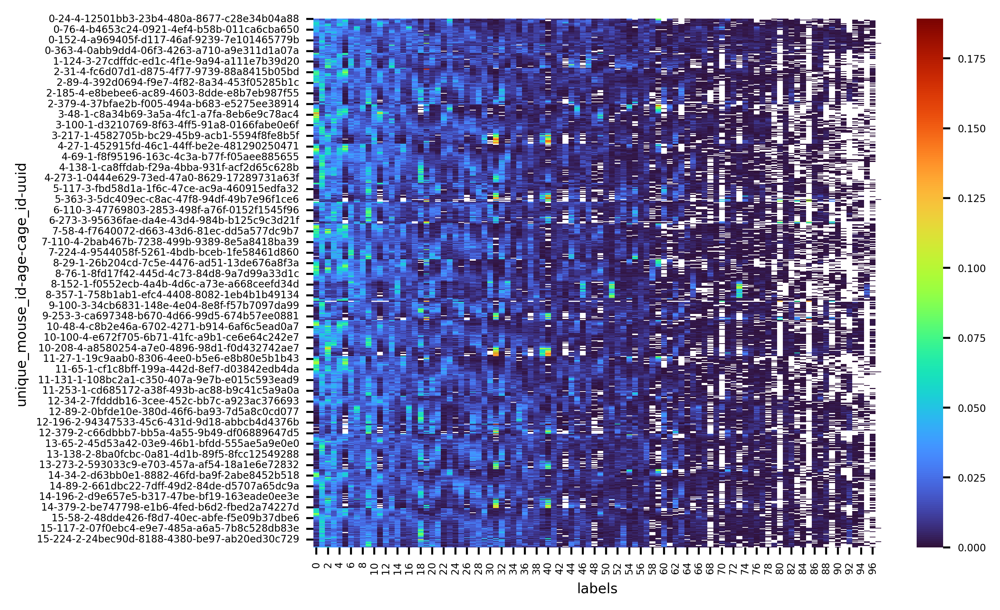

In [59]:
ax = sns.heatmap(usage_mtx, cmap='turbo', vmin=0)

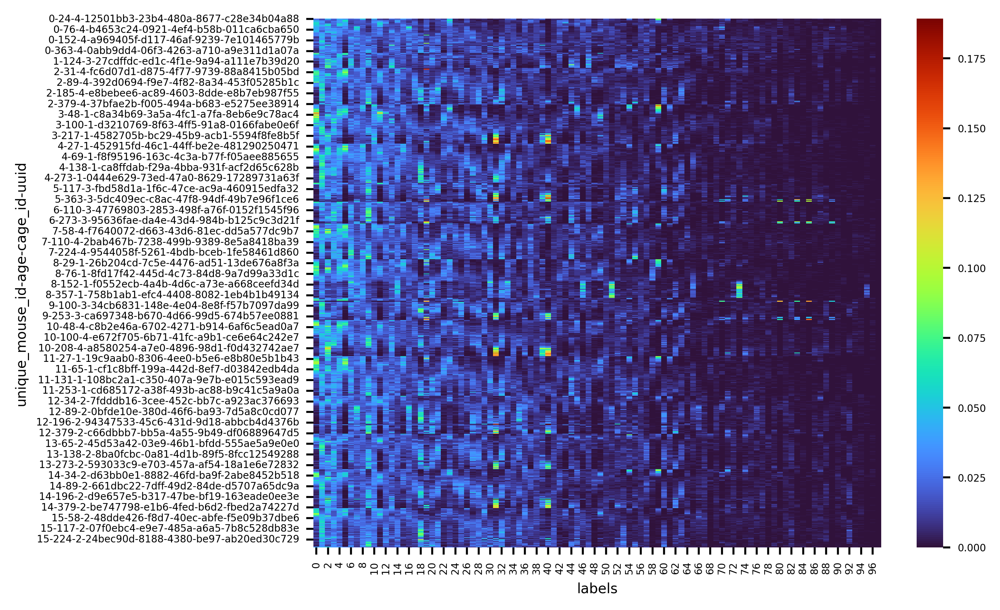

In [60]:
ax = sns.heatmap(usage_mtx.fillna(0), cmap='turbo', vmin=0)

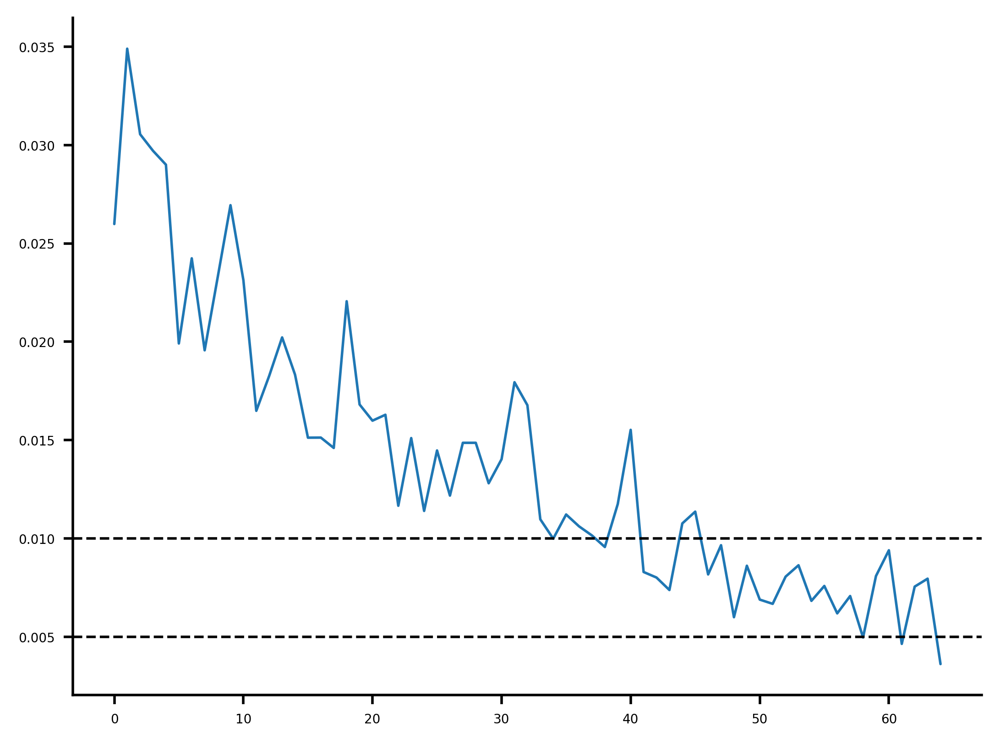

In [61]:
plt.plot((usage_mtx.mean() / usage_mtx.mean().sum()).iloc[:65])
plt.axhline(0.01, color='k', linestyle='--')
plt.axhline(0.005, color='k', linestyle='--')
sns.despine()

In [62]:
keep_usage_mtx = usage_mtx.iloc[:, :65]

## Dim. reduction

### UMAP

In [74]:
mdl = umap.UMAP(n_components=2, n_neighbors=25, metric=jensenshannon, random_state=42)
embedding = mdl.fit_transform(keep_usage_mtx.fillna(0))

/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/umap/umap_.py:1772: UserWarning: custom distance metric does not return gradient; inverse_transform will be unavailable. To enable using inverse_transform method, define a distance function that returns a tuple of (distance [float], gradient [np.array])
  warn(


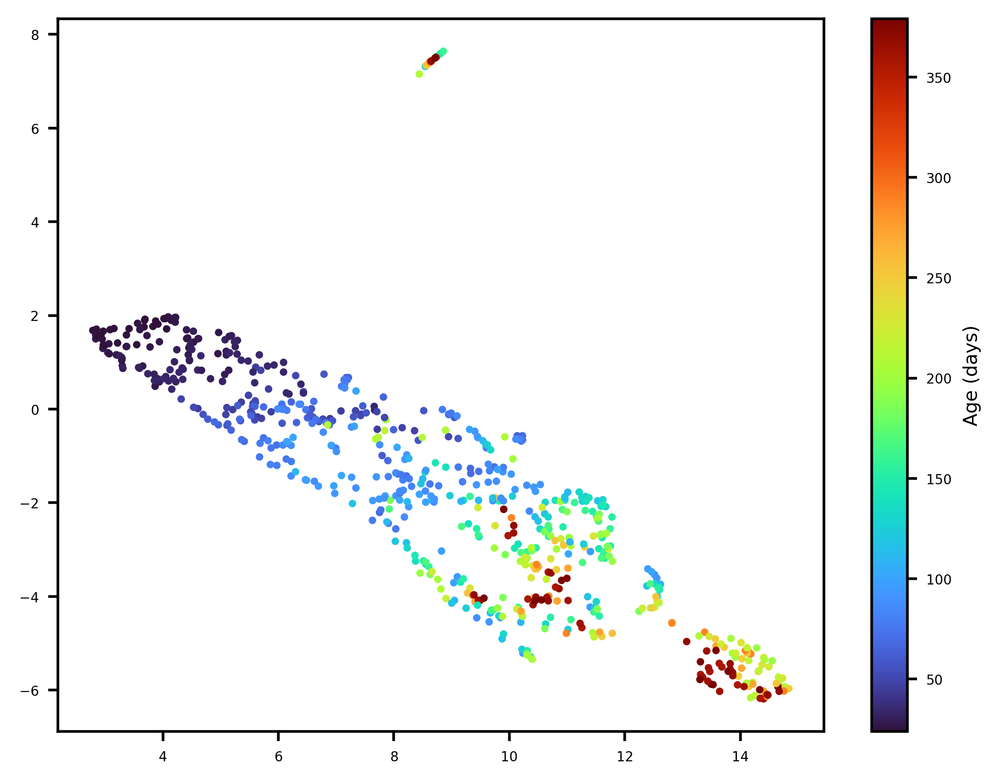

In [75]:
pc = plt.scatter(*embedding.T, c=usage_mtx.index.get_level_values('age'), cmap='turbo', s=4)
plt.colorbar(pc, label='Age (days)')

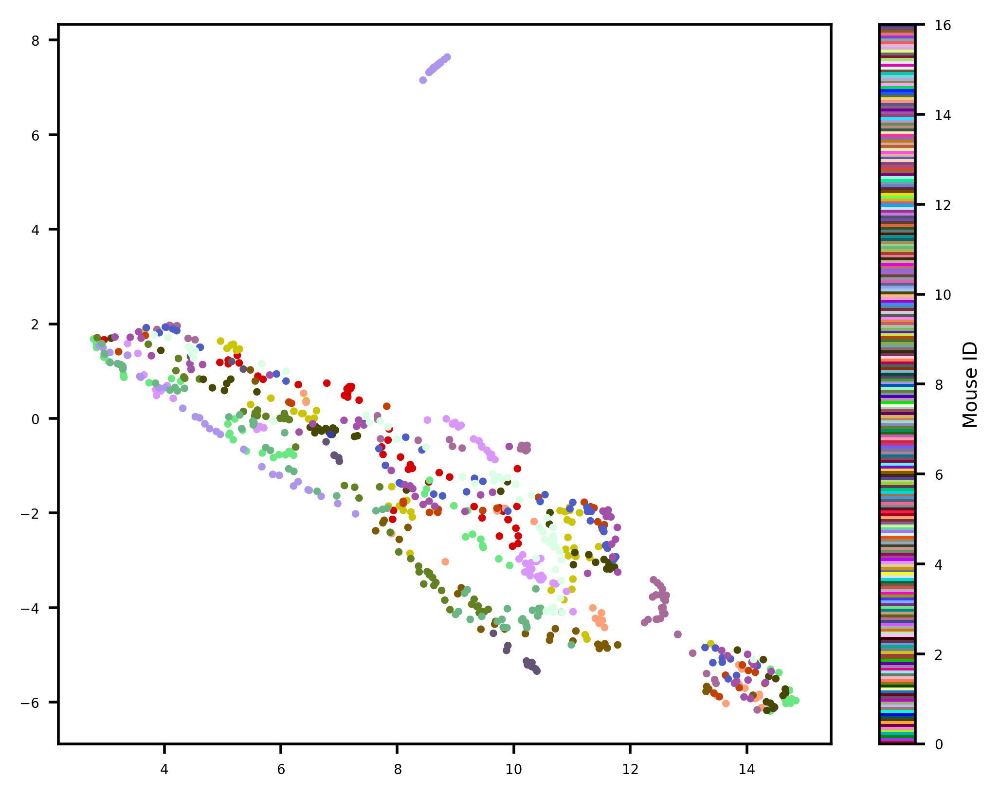

In [76]:
pc = plt.scatter(*embedding.T, c=usage_mtx.index.get_level_values('unique_mouse_id'), cmap=cc.cm.glasbey, s=4)
plt.colorbar(pc, label='Mouse ID')

### PCA (log-transform)

In [77]:
mdl = PCA(n_components=2)
embedding = mdl.fit_transform(np.log(keep_usage_mtx.fillna(0) + 1e-6))

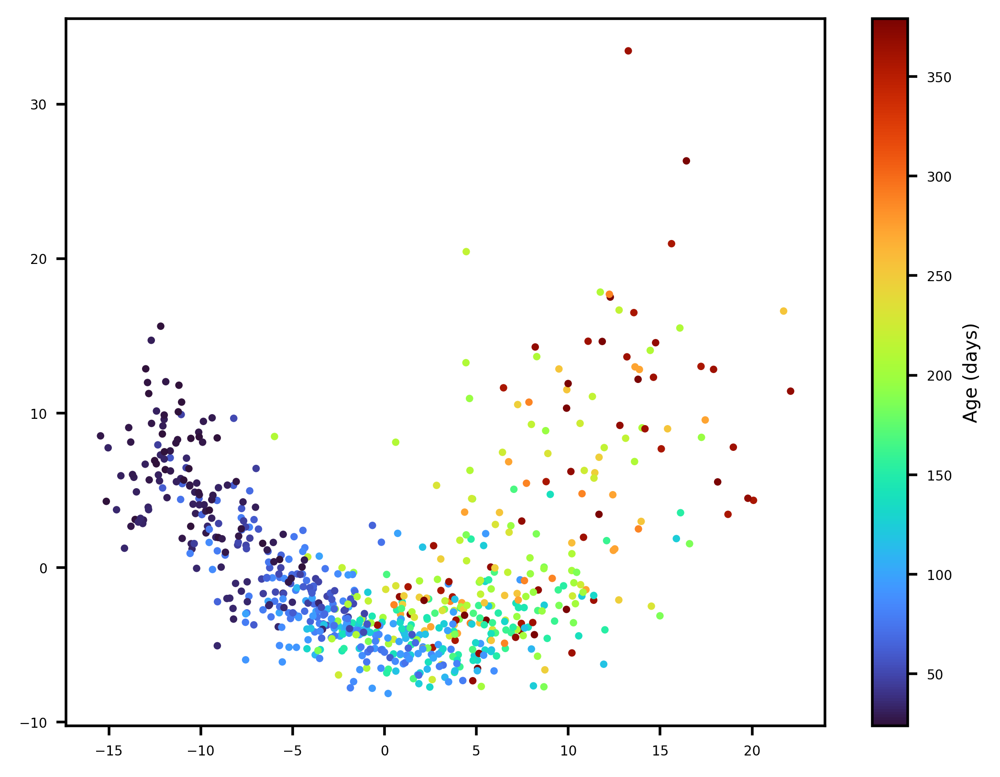

In [78]:
pc = plt.scatter(*embedding.T, c=usage_mtx.index.get_level_values('age'), cmap='turbo', s=4)
plt.colorbar(pc, label='Age (days)')

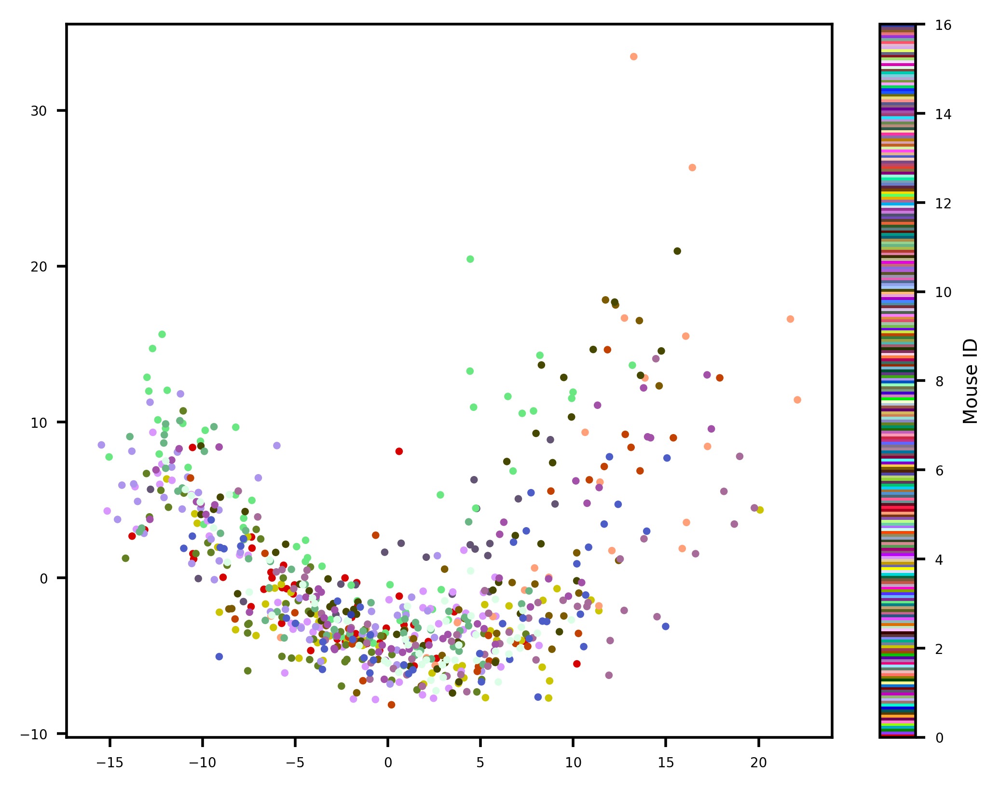

In [79]:
pc = plt.scatter(*embedding.T, c=usage_mtx.index.get_level_values('unique_mouse_id'), cmap=cc.cm.glasbey, s=4)
plt.colorbar(pc, label='Mouse ID')

### PCA (no transform)

In [80]:
mdl = PCA(n_components=2)
embedding = mdl.fit_transform(keep_usage_mtx.fillna(0))

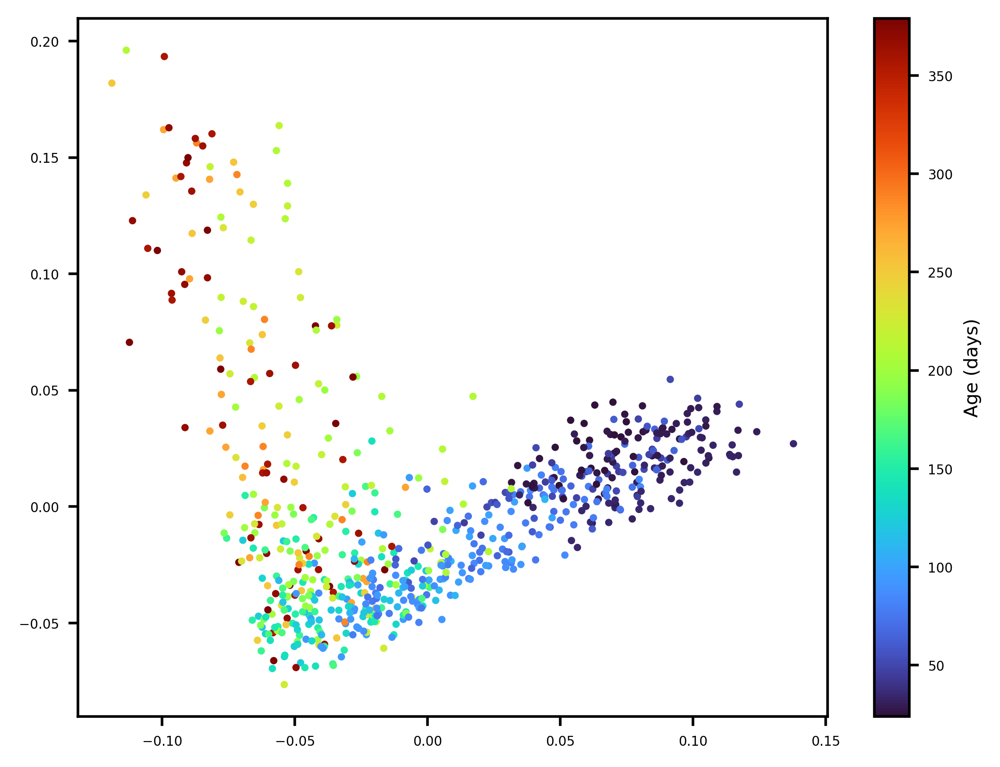

In [81]:
pc = plt.scatter(*embedding.T, c=usage_mtx.index.get_level_values('age'), cmap='turbo', s=4)
plt.colorbar(pc, label='Age (days)')

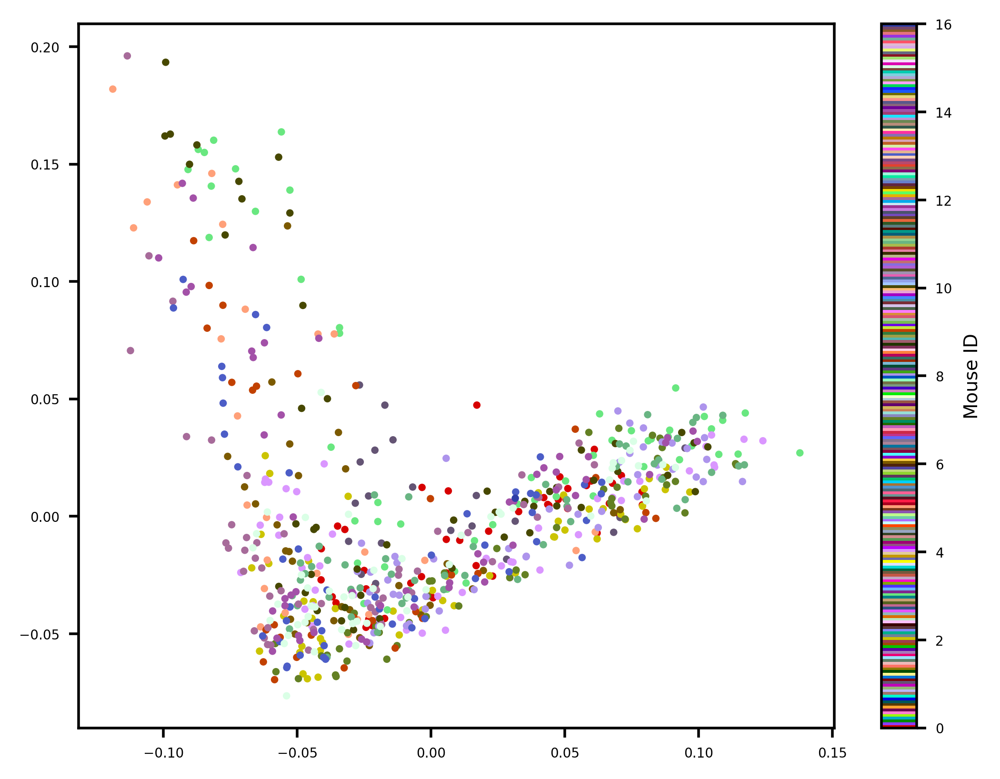

In [82]:
pc = plt.scatter(*embedding.T, c=usage_mtx.index.get_level_values('unique_mouse_id'), cmap=cc.cm.glasbey, s=4)
plt.colorbar(pc, label='Mouse ID')

## Combine male - female

In [84]:
df = pd.read_parquet(paths.intermediate_folder / "rec_lon_male.parquet")
df['sex'] = 'male'
df2 = pd.read_parquet(paths.intermediate_folder / "rec_lon_fema.parquet")
df2['sex'] = 'female'

In [85]:
df = pd.concat([df, df2], ignore_index=True)

In [87]:
unique_mouse_id = pd.factorize(df['mouse_id'].astype(pd.StringDtype()) + df['cage_id'].astype(pd.StringDtype()) + df['sex'])[0]
df['unique_mouse_id'] = unique_mouse_id

In [88]:
group_keys = ['sex', 'unique_mouse_id', 'age', 'mouse_id', 'cage_id', 'uuid']
usage = df.query('onset').groupby(group_keys, observed=True)['labels'].value_counts(normalize=True).rename('usage').reset_index()

In [89]:
usage['uuid'] = usage['uuid'].astype(pd.StringDtype())

In [90]:
full_usage_mtx = usage.pivot_table(index=['sex', 'unique_mouse_id', 'age', 'cage_id', 'uuid'], columns='labels', values='usage')#.fillna(0)

<Axes: >

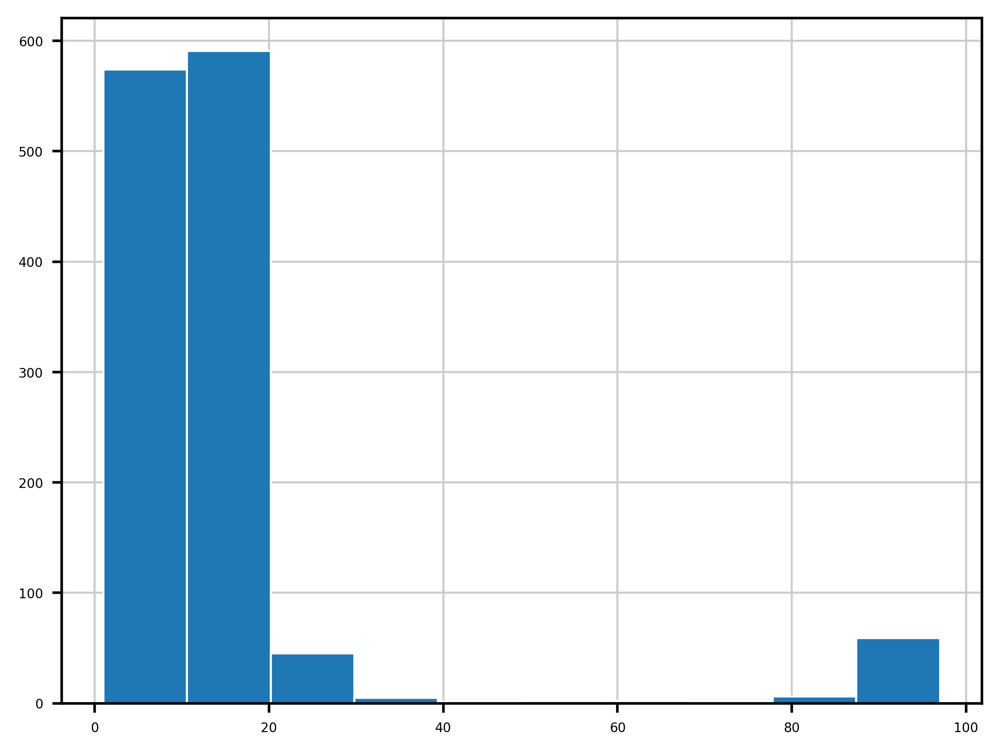

In [91]:
total_nans = full_usage_mtx.isna().sum(axis=1)
keep_mask = total_nans < 50
full_usage_mtx.isna().sum(axis=1).hist()

In [92]:
usage_mtx = full_usage_mtx.loc[keep_mask]

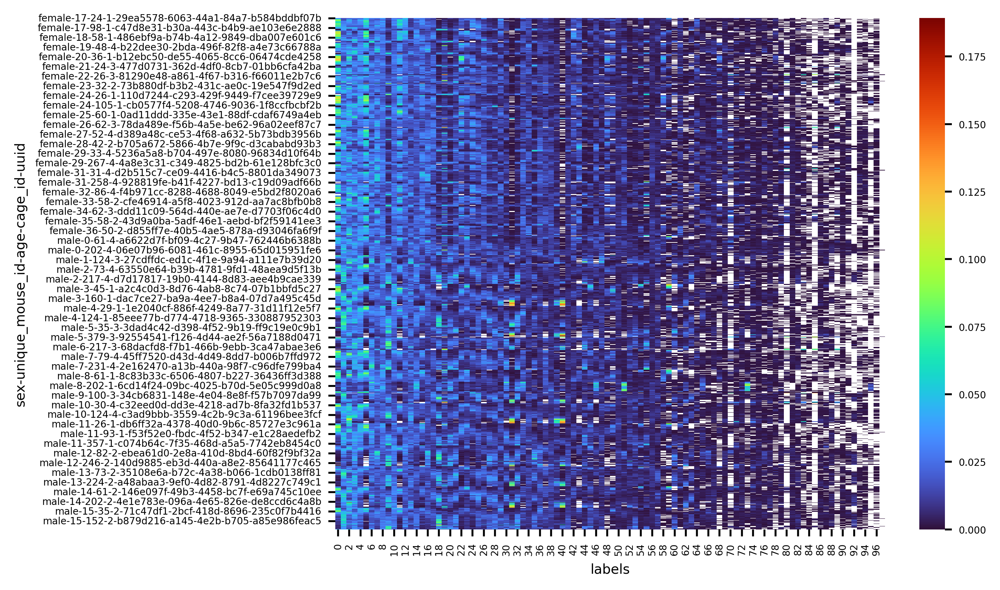

In [93]:
ax = sns.heatmap(usage_mtx, cmap='turbo', vmin=0)

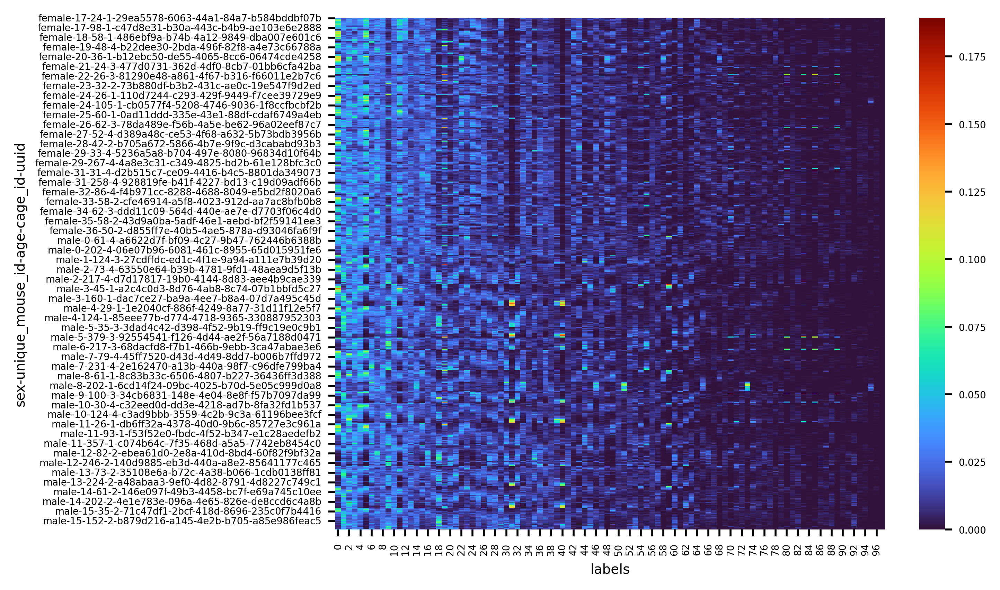

In [95]:
ax = sns.heatmap(usage_mtx.fillna(0), cmap='turbo', vmin=0)

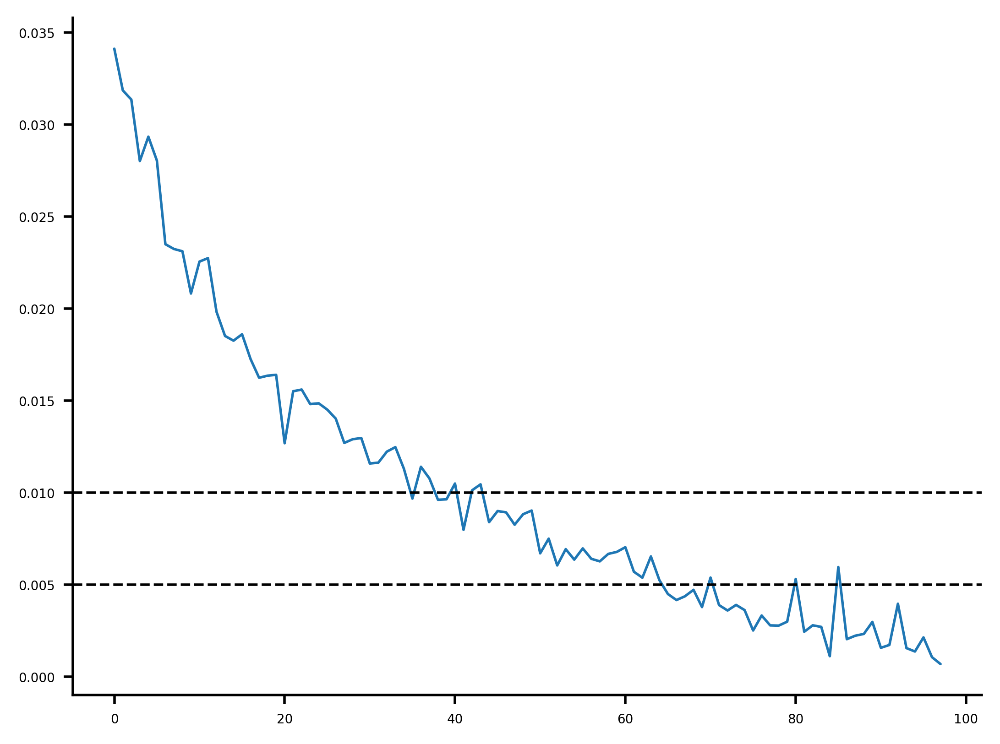

In [96]:
plt.plot((usage_mtx.mean() / usage_mtx.mean().sum()))
plt.axhline(0.01, color='k', linestyle='--')
plt.axhline(0.005, color='k', linestyle='--')
sns.despine()

In [97]:
keep_usage_mtx = usage_mtx.iloc[:, :70]

## Dim. reduction

### PCA (log-transform)

In [101]:
mdl = PCA(n_components=2)
embedding = mdl.fit_transform(np.log(keep_usage_mtx.fillna(0) + 1e-6))

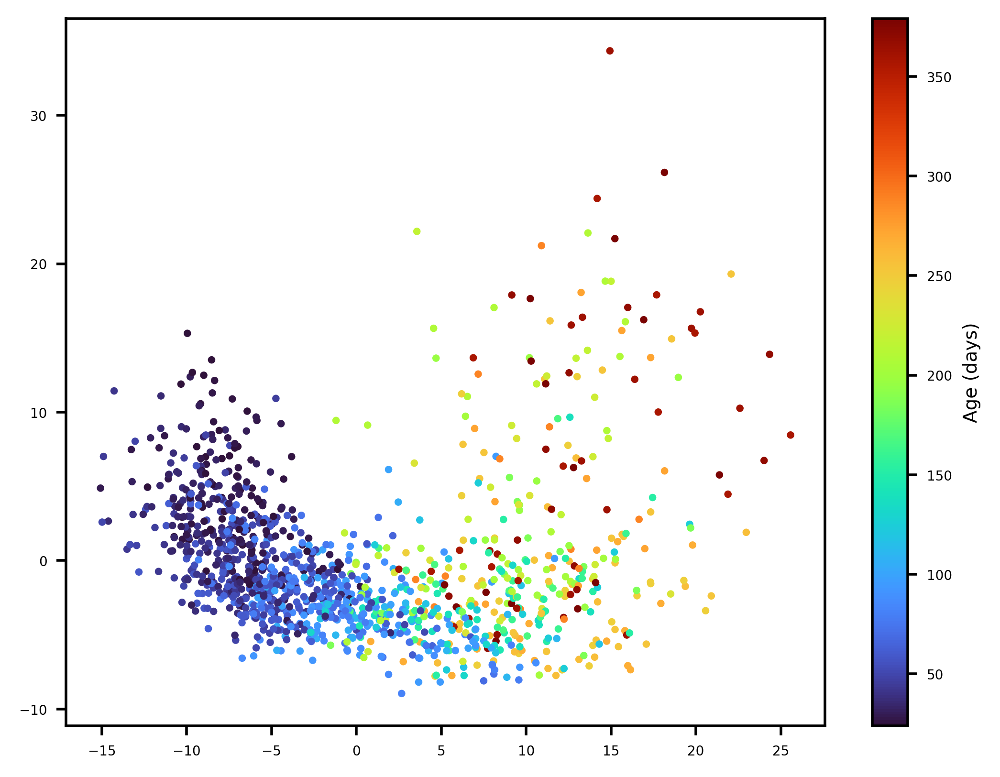

In [102]:
pc = plt.scatter(*embedding.T, c=keep_usage_mtx.index.get_level_values('age'), cmap='turbo', s=4)
plt.colorbar(pc, label='Age (days)')

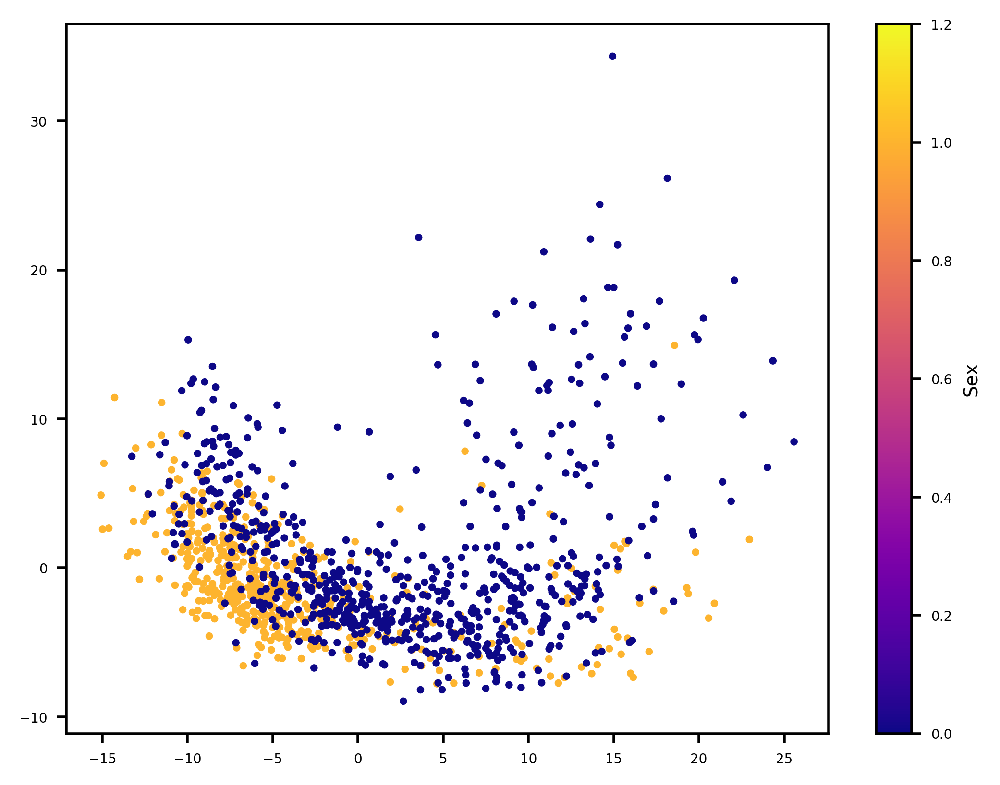

In [114]:
# 1 = female
pc = plt.scatter(*embedding.T, c=keep_usage_mtx.index.get_level_values('sex').map(dict(male=0, female=1)), cmap='plasma', s=4, vmax=1.2)
plt.colorbar(pc, label='Sex')

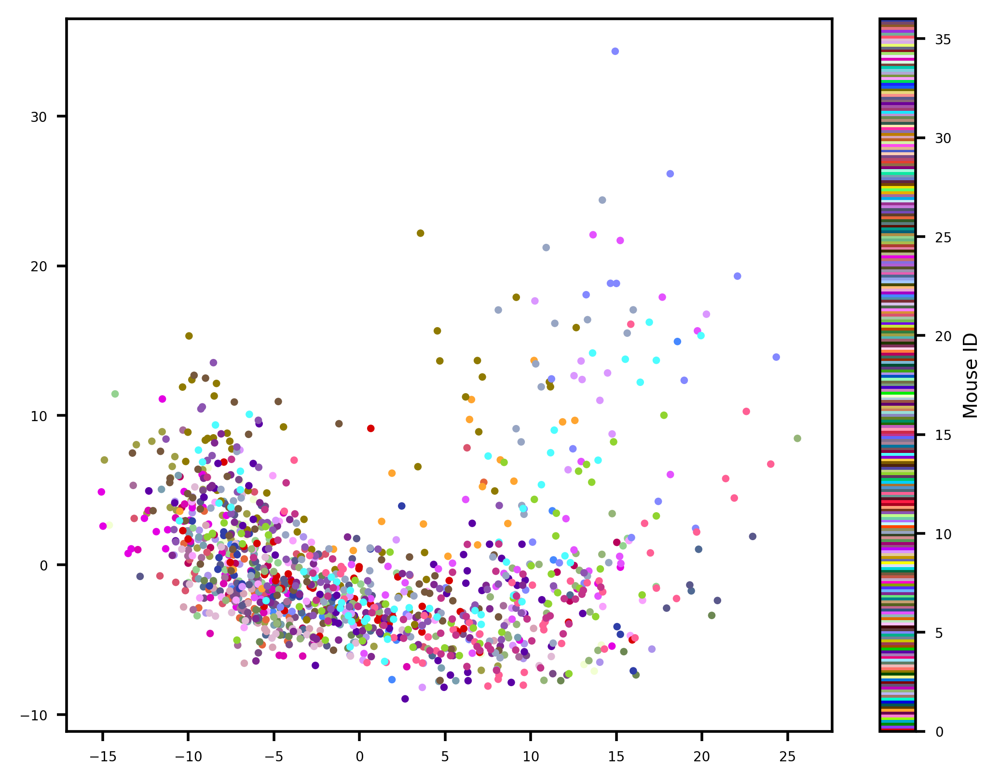

In [116]:
pc = plt.scatter(*embedding.T, c=keep_usage_mtx.index.get_level_values('unique_mouse_id'), cmap=cc.cm.glasbey, s=4)
plt.colorbar(pc, label='Mouse ID')

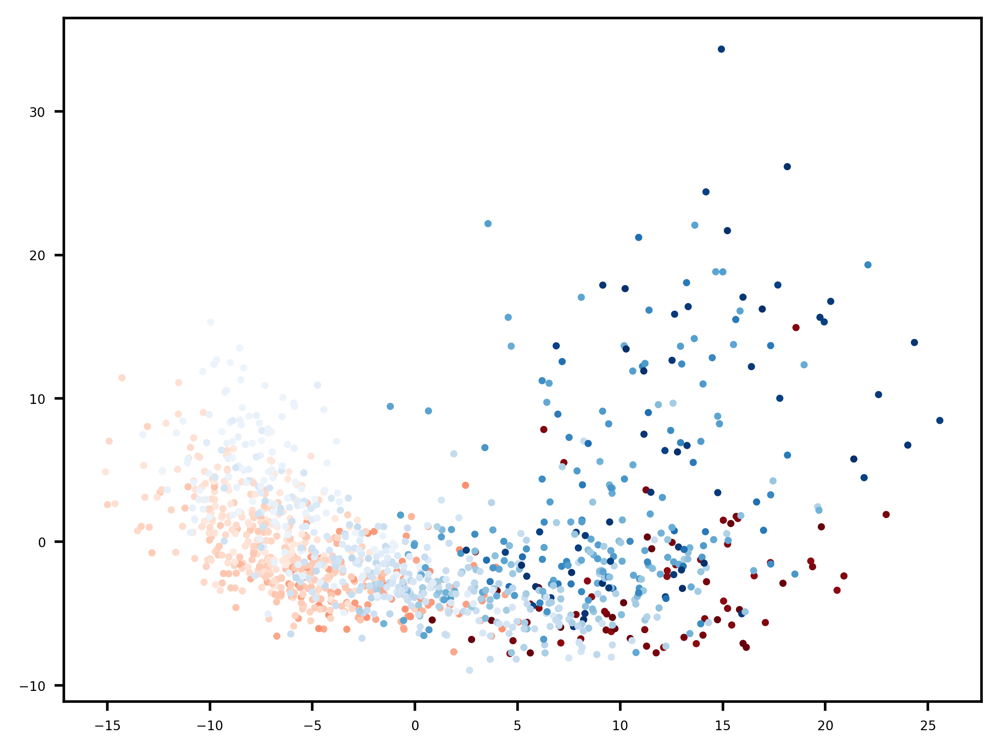

In [119]:
# break up colormaps into sexes
mask = keep_usage_mtx.index.get_level_values('sex') == 'female'
female_age = keep_usage_mtx.index.get_level_values('age')[mask]
male_age = keep_usage_mtx.index.get_level_values('age')[~mask]
pc = plt.scatter(*embedding[mask].T, c=female_age, cmap='Reds', s=4, vmin=5)
pc = plt.scatter(*embedding[~mask].T, c=male_age, cmap='Blues', s=4, vmin=5)
# plt.colorbar(pc, label='Age (days)')